In [1]:
import tifffile
import numpy as np
import matplotlib.pyplot as plt
from skimage.registration import phase_cross_correlation
from scipy.ndimage import shift
from skimage.filters import gaussian, threshold_otsu
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.segmentation import relabel_sequential

In [2]:
tif_path = 'data/Norma_2pl_10um_50mW_512x512_dwt88_zoom8_00001_00002.tif'

In [3]:
# Memory-mapped (mmemap) files are used for accessing small segments of large files on disk, without reading the entire file into memory
with tifffile.TiffFile(tif_path) as tif:
    data = tif.asarray(out="memmap") 

In [4]:
data = data - data.min() # Ensure lowest value starts at 0
data.shape

(4000, 512, 512)

In [301]:
plane1 = data[0::2] # Even frames = plane 1
plane2 = data[1::2] # Odd frames = plane 2
plane1.shape, plane2.shape

((2000, 512, 512), (2000, 512, 512))

# Rigid Registration

In [7]:
def align_frames(frames, n_sample_frames=250, n_top_frames=20):
    """
    Apply rigid motion correction to a stack of frames by:
    - Taking a random subset of frames
    - Taking frame that is most correlated to all others as seed frame
    - Averaging the seed frame with the 19 other frames it's most correlated with to produce reference frame
    - Align each frame with the reference frame using phase cross correlation
    
    Parameters:
        frames (np.ndarray): 3D array of frames with shape (N, H, W).
    
    Returns:
        reference_frame (np.ndarray): The computed reference frame - a 2D array with shape (H, W).
        aligned_frames (np.ndarray): 3D array of frames aligned to the reference frame with shape (N, H, W).
    """
    
    # Take up to 250 random frames
    if frames.shape[0] < n_sample_frames:
        size = frames.shape[0]
    else:
        size = n_sample_frames
    random_indices = np.random.choice(len(frames), size=size, replace=False)
    sample_frames = frames[random_indices]

    # Flatten each frame into 1D
    sample_frames_flat = sample_frames.reshape(size, -1)
    
    # Compute correlation matrix of each frame with all other frames
    corr_matrix = np.corrcoef(sample_frames_flat)
    
    # Avg the correlation of each frame with all other frames
    avg_corr = np.mean(corr_matrix, axis=1)
    
    # Get frame with highest average correlation
    seed_idx = np.argmax(avg_corr)
    seed_frame = sample_frames[seed_idx]
    
    # Average top n frames most correlated with seed frame
    seed_corr = corr_matrix[seed_idx].copy() # Get correlations of seed frame with all other frames
    sorted_indices = np.argsort(seed_corr)[::-1] # Sort indices, starting from the index of the frame with the highest correlation to seed
    top_indices = sorted_indices[:n_top_frames] # Take top n indices (default = 20)
    top_frames = sample_frames[top_indices] # Get top n frames
    reference_frame = np.median(top_frames, axis=0) # Average top n most correlated frames to produce reference frame
    
    # Create new array of frames, each aligned to the reference image by phase cross correlation
    aligned_frames = np.empty_like(frames) 
    for i in range(frames.shape[0]):
        curr_frame = frames[i]
        
        # Use phase correlation to identify the relative shift between the reference frame and current frame
        shift_vector, error, diffphase = phase_cross_correlation(reference_frame, curr_frame)
        
        # Apply the shift to the current frame
        aligned_frame = shift(curr_frame, shift=shift_vector).copy()
        aligned_frames[i] = aligned_frame

    return reference_frame, aligned_frames

In [8]:
def visualise_alignment(ref_frame, unaligned_frame, aligned_frame):
    """
    Visualise motion correction by comparing an unaligned and aligned frame to the reference image and computing the diff.
    
    Parameters:
        ref_frame (np.ndarray): 2D array with shape (H, W).
        unaligned_frame (np.ndarray): 2D array with shape (H, W).
        aligned_frame (np.ndarray): 2D array with shape (H, W).
    
    Returns:
        Nothing, but makes a 3x2 plot visualising the alignment.

    """
    
    # Comp difference matrix
    unaligned_diff = unaligned_frame - ref_frame
    aligned_diff = aligned_frame - ref_frame 

    # Comp correlations
    unaligned_corr = np.corrcoef(ref_frame.ravel(), unaligned_frame.ravel())[0, 1]
    aligned_corr = np.corrcoef(ref_frame.ravel(), aligned_frame.ravel())[0, 1]

    # Get max absolute diff to scale color map
    max_diff = max(np.abs(unaligned_diff).max(), np.abs(aligned_diff).max())
    vmin, vmax = -max_diff, max_diff

    plt.figure(figsize=(14, 14))

    img_cmap='viridis'
    diff_cmap='bwr'
    
    # Reference frame
    plt.subplot(3, 2, 1)
    plt.imshow(ref_frame, cmap=img_cmap)
    plt.title("Reference")
    plt.axis("off")

    # Reference frame
    plt.subplot(3, 2, 2)
    plt.imshow(ref_frame, cmap=img_cmap)
    plt.title("Reference")
    plt.axis("off")
    
    # Unaligned frame
    plt.subplot(3, 2, 3)
    plt.imshow(unaligned_frame, cmap=img_cmap)
    plt.title("Unaligned Frame")
    plt.axis("off")
    
    # Aligned frame
    plt.subplot(3, 2, 4)
    plt.imshow(aligned_frame, cmap=img_cmap)
    plt.title("Aligned Frame")
    plt.axis("off")
    
    # Unaligned diff
    plt.subplot(3, 2, 5)
    plt.imshow(unaligned_diff, cmap=diff_cmap, vmin=vmin, vmax=vmax)
    plt.title(f"Unaligned Difference (Corr: {unaligned_corr:.3f})")
    plt.colorbar(label="Intensity difference")
    plt.axis("off")
    
    # Aligned diff
    plt.subplot(3, 2, 6)
    plt.imshow(aligned_diff, cmap=diff_cmap, vmin=vmin, vmax=vmax)
    plt.title(f"Aligned Difference (Corr: {aligned_corr:.3f})")
    plt.colorbar(label="Intensity difference")
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()

In [10]:
def show(frame):
    """
    Render a 2D matrix as an image.

    Parameters:
        frame (np.ndarray): 2D array with shape (H, W).

    Returns:
        Nothing, just plots an image.
    """
    
    plt.imshow(frame, vmax=frame.max(), vmin=frame.min())
    plt.colorbar()
    plt.axis('off')
    plt.show();

In [11]:
def plot_intensity(data, y_lim=(-20, 60)):
    """
    Plot intensity timeseries.

    Parameters:
        data (np.ndarray): 1D array of average intensities per frame with length (L).
        y_lim (tuple): tuple of (ymin, ymax)

    Returns:
        Nothing, just plots the change in intensity over time
    """
    
    plt.figure(figsize=(8,4))
    plt.plot(data)

    plt.xlabel("Frame")
    plt.ylabel("Average Intensity")
    plt.xlim(0, 500)
    plt.ylim(y_lim)
    plt.gca().spines[['top', 'right']].set_visible(False)

    plt.show()

In [74]:
def generate_crop_indices(aligned_frames):
    """
    This function aims to crop the images the remove edge artifacts.
    It automatically detects indices needed to crop away outer rows/cols whose mean brightness is less than 2SD below the mean row/col brightness.
    Starts at outer most rows/cols and keeps moving until it hits the first row/col that is not 2SD below the mean.

    Parameters:
        aligned_frames (np.ndarray): 3D array of frames aligned to the reference frame with shape (N, H, W).

    Returns:
        crop_box (tuple of ints): (top, bottom, left, right) indices used for cropping.
    """

    N, H, W = aligned_frames.shape
    
    # Compute avg image across all frames
    avg_img = aligned_frames.mean(axis=0)  # shape (H, W)
    
    # Compute row-wise and column-wise mean of avg image
    row_means = avg_img.mean(axis=1)  # shape (H,)
    col_means = avg_img.mean(axis=0)  # shape (W,)
    
    # Compute the mean and SD of row and col means
    mean_row_brightness = np.mean(row_means)
    sd_row_brightness = np.std(row_means)
    mean_col_brightness = np.mean(col_means)
    sd_col_brightness = np.std(col_means)
    
    # Start from top row, move down while row below threshold
    top = 0
    while top < H and row_means[top] < mean_row_brightness - (2 * sd_row_brightness):
        top += 1
    
    # Start from bottom, move up while row below threshold
    bottom = H - 1
    while bottom >= 0 and row_means[bottom] < mean_row_brightness - (2 * sd_row_brightness):
        bottom -= 1
    
    # Start from left, move right while col below threshold
    left = 0
    while left < W and col_means[left] < mean_col_brightness - (2 * sd_col_brightness):
        left += 1
    
    # Start from right, move left while col below threshold
    right = W - 1
    while right >= 0 and col_means[right] < mean_col_brightness - (2 * sd_col_brightness):
        right -= 1
    
    return (top, bottom, left, right)

In [13]:
def crop(frames, top, bottom, left, right):
    """
    Crops each frame in frames using the indices generated by generate_crop_indices.

    Parameters:
        frames (np.ndarray): 3D array of frames with shape (N, H, W).
        top, bottom, left, right (ints): indices used for cropping.
        
    Returns:
        cropped_frames (np.ndarray): The cropped 3D array of shape (N, bottom-top, right-left).
    """
    if frames.ndim == 3:
        cropped_frames = frames[:, top:bottom+1, left:right+1].copy()
    else:
        cropped_frames = frames[top:bottom+1, left:right+1].copy()
    return cropped_frames

In [14]:
def compare_corr(unaligned_frames, aligned_frames):
    """
    Computes a mean correlation score for the unaligned and aligned frame series.
    
    Parameters:
        unaligned_frames (np.ndarray): 3D array with shape (N, H, W).
        aligned_frames (np.ndarray): 3D array with shape (N, H, W).
    
    Returns:
        result_string: String containing the mean correlations of the unaligned and aligned series.

    """

    # Compute correlation matrix of each frame with all other frames
    size = unaligned_frames.shape[0]
    mean_corr_unaligned = np.mean(np.corrcoef(unaligned_frames.reshape(size, -1)), axis=1).mean()
    mean_corr_aligned = np.mean(np.corrcoef(aligned_frames.reshape(size, -1)), axis=1).mean()

    result_string = f'Mean Unaligned Corr: {mean_corr_unaligned:.3f}\nMean Aligned Corr:   {mean_corr_aligned:.3f}'
    
    return result_string

In [15]:
ref1, aligned1 = align_frames(plane1)
t, b, l, r = generate_crop_indices(aligned1)
crop_ref1 = crop(ref1, t, b, l, r)
crop_plane1 = crop(plane1, t, b, l, r)
crop_aligned1 = crop(aligned1, t, b, l, r)

In [16]:
ref2, aligned2 = align_frames(plane2)
t, b, l, r = generate_crop_indices(aligned2)
crop_ref2 = crop(ref2, t, b, l, r)
crop_plane2 = crop(plane2, t, b, l, r)
crop_aligned2 = crop(aligned2, t, b, l, r)

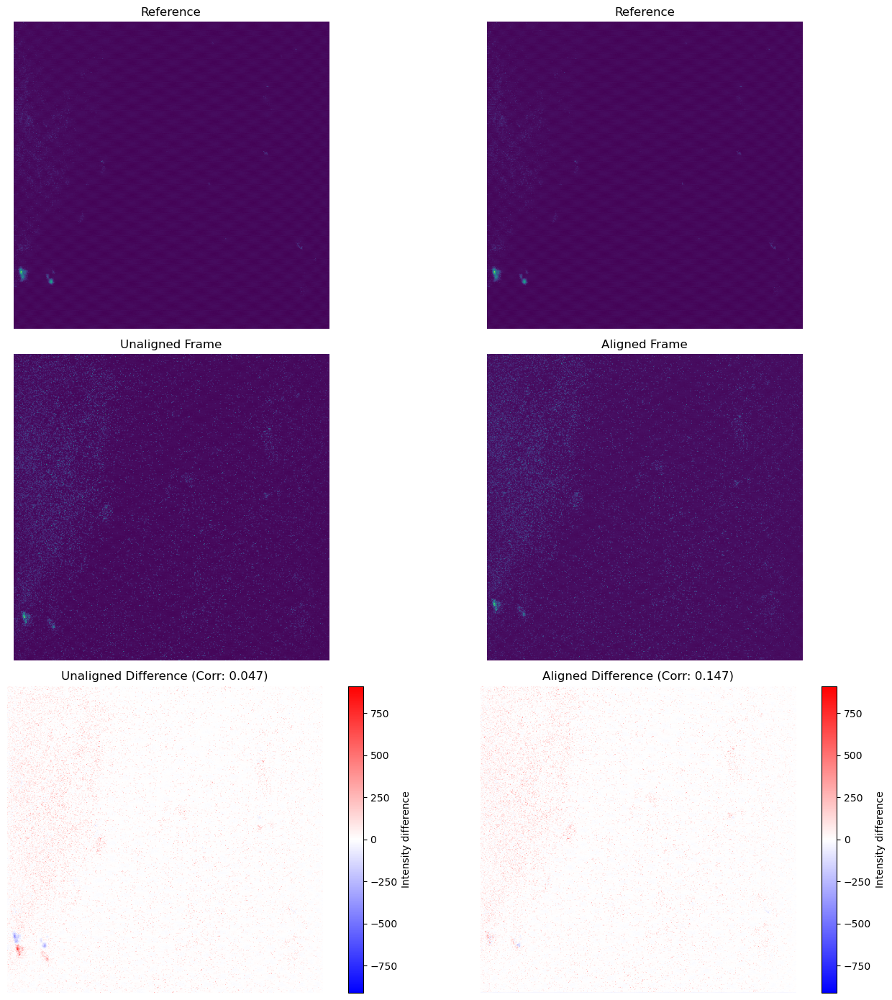

In [17]:
visualise_alignment(crop_ref1, crop_plane1[500], crop_aligned1[500])

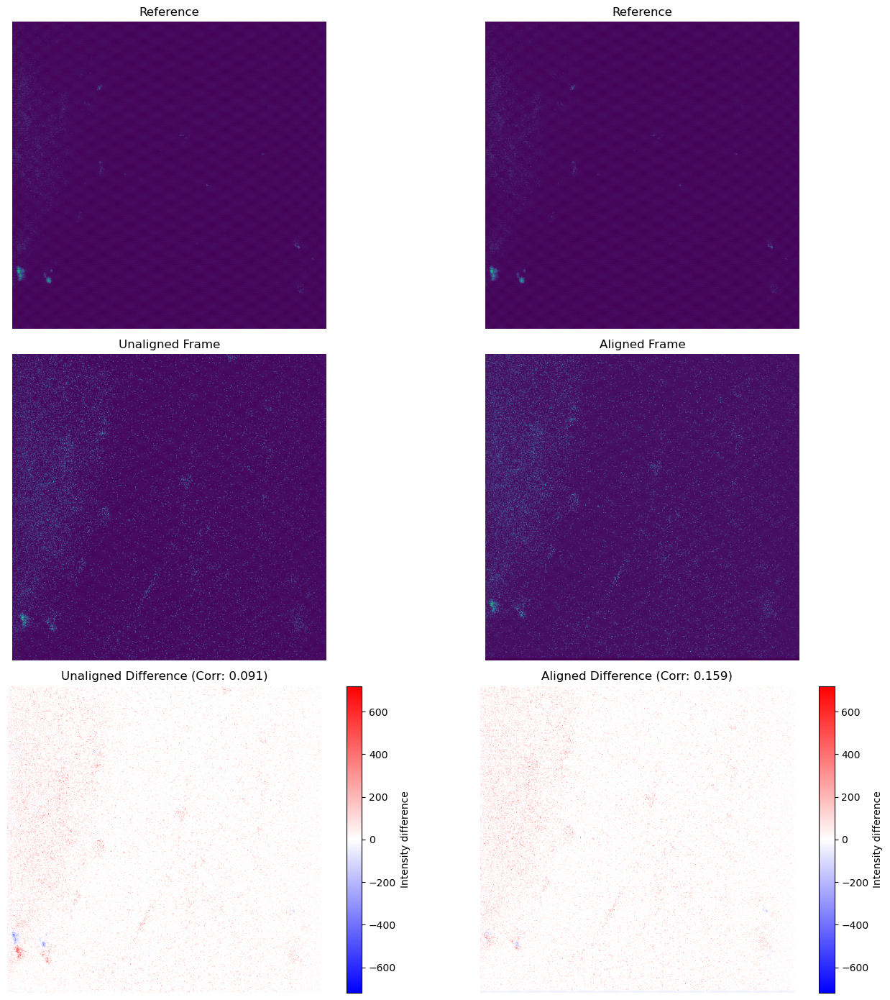

In [18]:
visualise_alignment(crop_ref2, crop_plane2[500], crop_aligned2[500])

In [19]:
print(compare_corr(crop_plane1, crop_aligned1))

Mean Unaligned Corr: 0.067
Mean Aligned Corr:   0.079


In [22]:
print(compare_corr(crop_plane2, crop_aligned2))

Mean Unaligned Corr: 0.070
Mean Aligned Corr:   0.080


In [23]:
# Save Files
tifffile.imwrite("unaligned_data_p1.tif", crop_plane1, imagej=True)
tifffile.imwrite("aligned_data_p1.tif", crop_aligned1, imagej=True)
tifffile.imwrite("unaligned_data_p2.tif", crop_plane2, imagej=True)
tifffile.imwrite("aligned_data_p2.tif", crop_aligned2, imagej=True)

# ROI Detection and ∆F/F Calculation

In [25]:
def make_rois(aligned_frames, threshold_multiplier=0.95, min_area=50):
    """
    Automatically generates ROIs by thresholding the average intensity image.

    Parameters:
        aligned_frames (np.ndarray): 3D array with size (N, H, W).
        multiplier (int): Values below 1 set a lower intensity threshold, leading to larger ROIs 
        min_area (int): ROIs with an area smaller than this are excluded.

    Returns:
        blurred_frame (np.ndarray): 2D array with size (H, W), representing the average frame with a gaussian blur applied.
        rois (np.ndarray): 2D array with size (H, W) where each ROI is filled with a unique integer label.
    """
    
    avg_frame = aligned_frames.mean(axis=0)
    blurred_frame = gaussian(avg_frame, sigma=3)

    # Threshold image based on pixel intensity
    th_val = threshold_otsu(blurred_frame)
    binary_mask = blurred_frame > (th_val*threshold_multiplier)
    binary_mask = closing(binary_mask, square(3))
    
    # Label connected components
    rois = label(binary_mask) # identifies connected groups and assigns a unique integer label to each group

    # Filter out rois smaller than min_area (measured in pixels)
    for roi in np.unique(rois):
        area = np.sum(np.where(rois == roi, 1, 0))
        if area < min_area:
            rois[rois == roi] = 0
    rois = relabel_sequential(rois)[0]

    return blurred_frame, rois

In [26]:
def plot_rois(blurred_frame, rois):
    """
    Plots two side by side images, one of the blurred average image, and the other of the same image with ROIs overlayed.

    Parameters:
        blurred_frame (np.ndarray): 2D array with size (H, W), representing the average frame with a gaussian blur applied.
        rois (np.ndarray): 2D array with size (H, W) where each ROI is filled with a unique integer label.

    Returns:
        Nothing, just plots the images.
    """
    # Make plot
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    
    # Make mask where pixels in background = True and everything else = False
    mask = np.where(rois == 0, 1, 0).astype(bool)

    im = axs[0].imshow(blurred_frame, vmax=blurred_frame.max(), vmin=blurred_frame.min())
    axs[0].set_title('Avg Intensity Image')
    axs[0].axis('off')

    im = axs[1].imshow(blurred_frame, vmax=blurred_frame.max(), vmin=blurred_frame.min())
    axs[1].contour(mask, levels=[0.5], colors='yellow', linewidths=0.5)
    axs[1].set_title('ROIs')
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

In [303]:
def plot_rois_deltaf(aligned_frames, blurred_frame, rois, roi, xlim=60, ylim=5):
    """
    Plots ∆F/F trace for chosen ROI next to the average intensity frame with the chosen ROI highlighted.

    Parameters:
        aligned_frames (np.ndarray): 3D array with size (N, H, W).
        blurred_frame (np.ndarray): 2D array with size (H, W), representing the average frame with a gaussian blur applied.
        rois (np.ndarray): 2D array with size (H, W) where each ROI is filled with a unique integer label.
        roi (int): chosen ROI.
        xlim (int): chosen x-axis limit.
        ylim (int): chosen y-axis limit.

    Returns:
        Nothing, just plots trace and highlights ROI.
    """
    
    # Ensure selected ROI exists
    rois_list = np.unique(rois)
    if roi not in rois_list:
        print(f'Please input an roi between {np.min(rois_list)} and {np.max(rois_list)}')
        return 

    # Make plot
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # Make mask where pixels in selected ROI = True and everything else = False
    mask = np.where(rois == roi, 1, 0).astype(bool)

    # If background selected, display image with background filled
    if roi == 0:
        im = axs[0].imshow(mask, vmax=mask.max(), vmin=mask.min())
        
    # Else, just display contour around selected ROI
    else:
        im = axs[0].imshow(blurred_frame, vmax=blurred_frame.max(), vmin=blurred_frame.min())
        axs[0].contour(mask, levels=[0.5], colors='yellow', linewidths=0.5)
    axs[0].axis('off')

    # Generate appropriate labels that will be used to title the plot
    if roi == 0:
        area = 'Background'
    else:
        area = 'ROI ' + str(roi)
    
    axs[0].set_title(area)

    # Convert frames to time
    n_frames = len(aligned_frames)
    frame_rate = 1 / 15  # 15 Hz
    planes = 2
    time_per_frame = frame_rate * planes
    
    # Create time array
    time_array = np.arange(n_frames) * time_per_frame  

    # Get avg intensity plot for selected ROI by applying mask
    avg_intensity = np.mean(aligned_frames[:, mask], axis=1)

    # Subtract background if current ROI is not the background
    if roi > 0:
        # Calculate avg background intensity
        bg_mask = np.where(rois == 0, 1, 0).astype(bool)
        avg_bg_intensity = np.mean(aligned_frames[:, bg_mask], axis=1)

        # Substact avg bg intensity 
        avg_intensity = avg_intensity - avg_bg_intensity
    
    # Calculate ∆F/F using median intensity as F 
    med = np.median(avg_intensity)
    delta_f = (avg_intensity - med) / med

    # Make intensity plot
    axs[1].plot(time_array, delta_f, label=f'ROI {roi}')
    axs[1].set_xlabel("Time (seconds)")
    axs[1].set_ylabel("∆F/F")
    axs[1].set_title(area)
    axs[1].set_xlim(0, xlim)
    axs[1].set_ylim(-ylim, ylim)
    axs[1].spines[['top', 'right']].set_visible(False)

    plt.tight_layout()
    plt.show()

In [28]:
def roll_avg(aligned_frames, roll_size=3):
    """
    Averages intensity data in each pixel using a rolling average.

    Parameters:
        aligned_frames (np.ndarray): 3D array with shape (N, H, W).
        roll_size (int): Number of frames to average over.

    Returns:
        roll_avg_frames (np.ndarray): 3D array with shape (N - roll_size + 1, H, W) where each frame is the rolling average of roll_size frames.
    """
    N = aligned_frames.shape[0]

    roll_avg_frames = np.array([
        np.mean(aligned_frames[i:i + roll_size], axis=0)
        for i in range(N - roll_size + 1)
    ])
    return roll_avg_frames

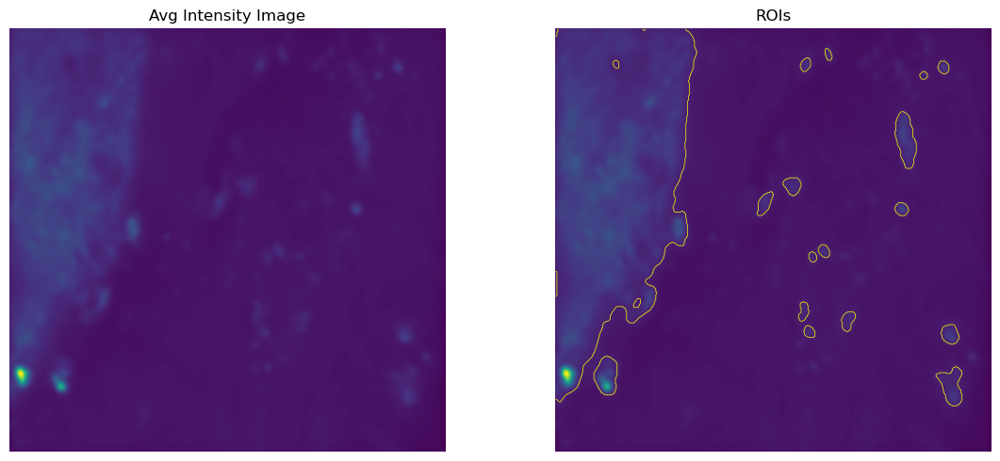

In [29]:
blurred_frame1, rois1 = make_rois(crop_aligned1, threshold_multiplier=0.91)
plot_rois(blurred_frame1, rois1)

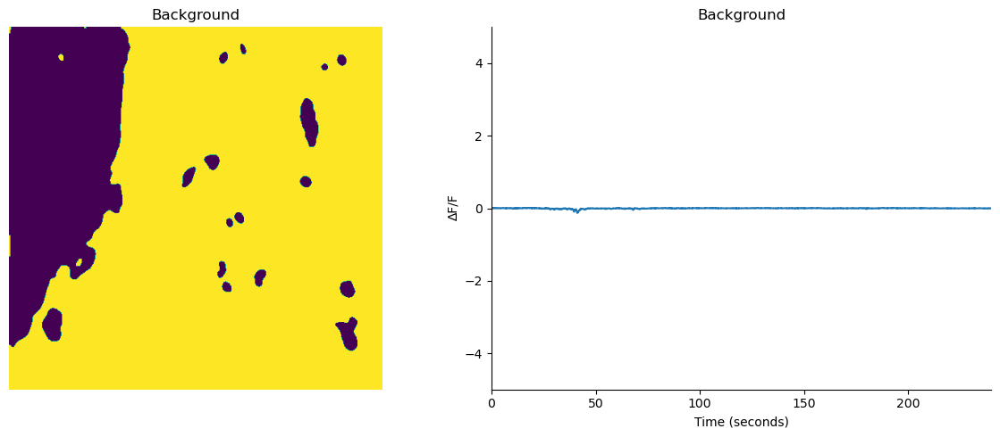

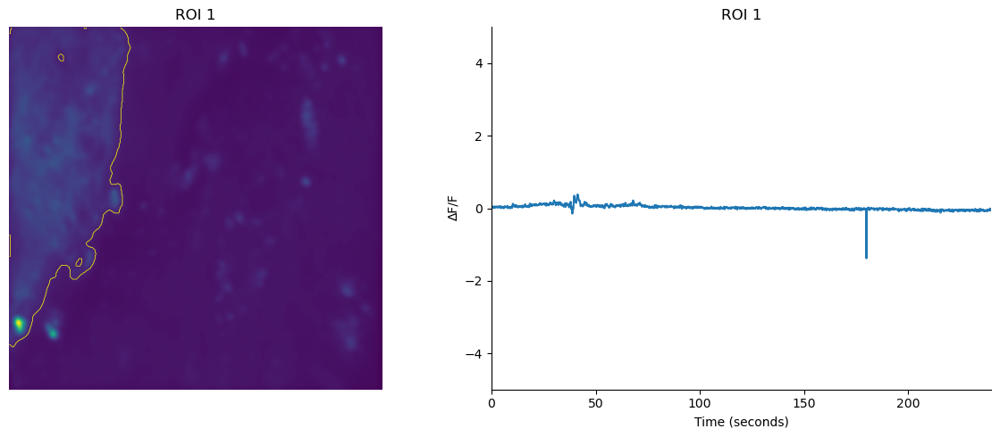

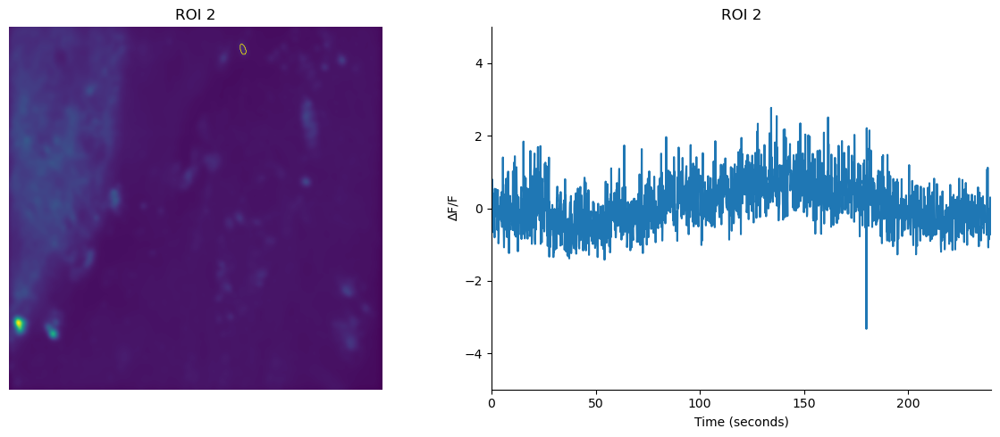

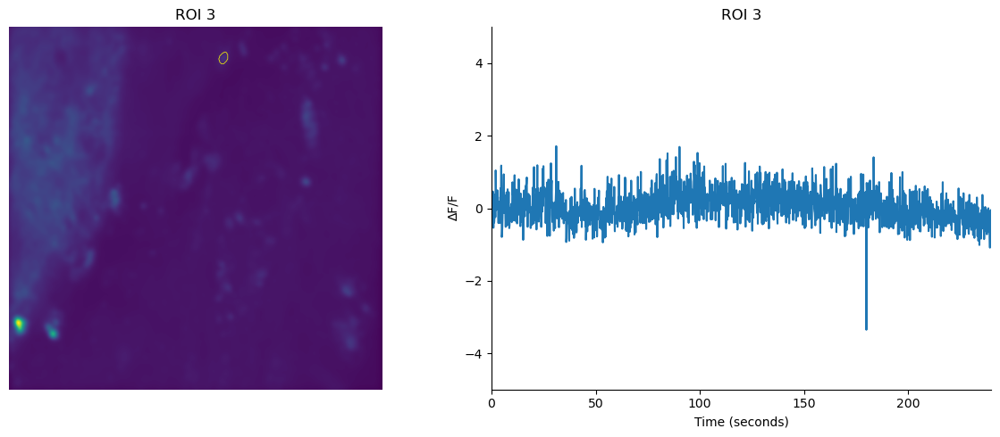

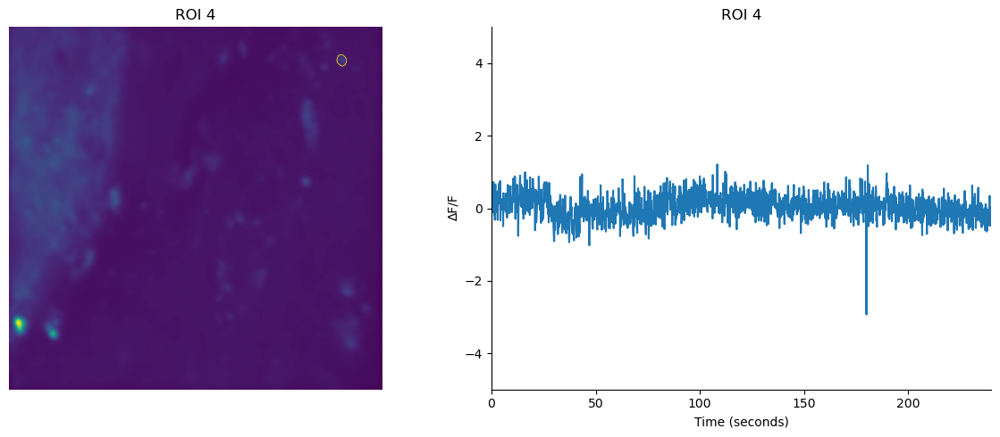

...

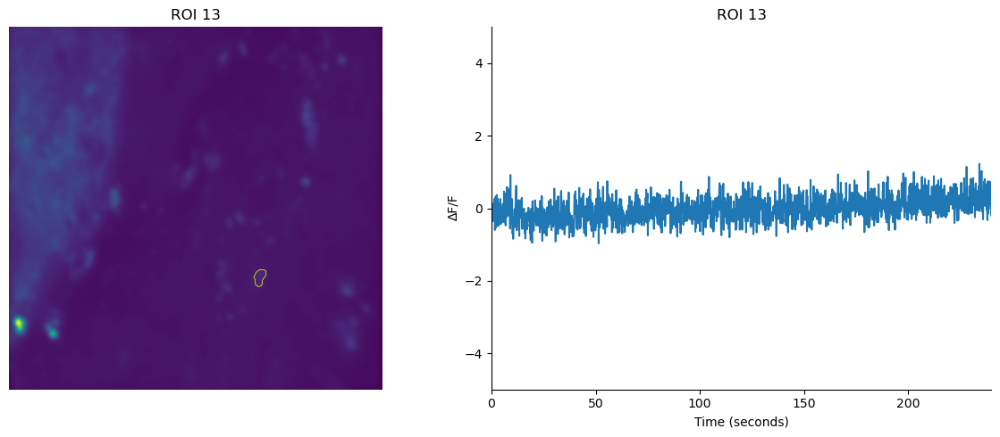

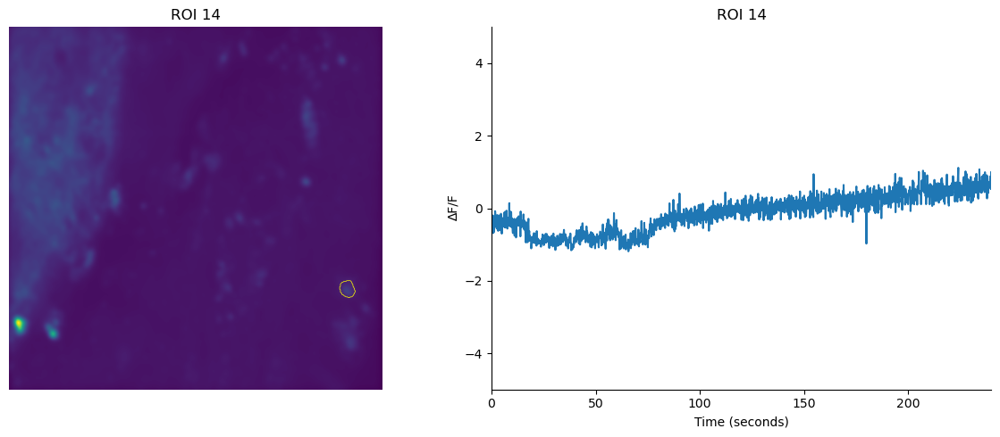

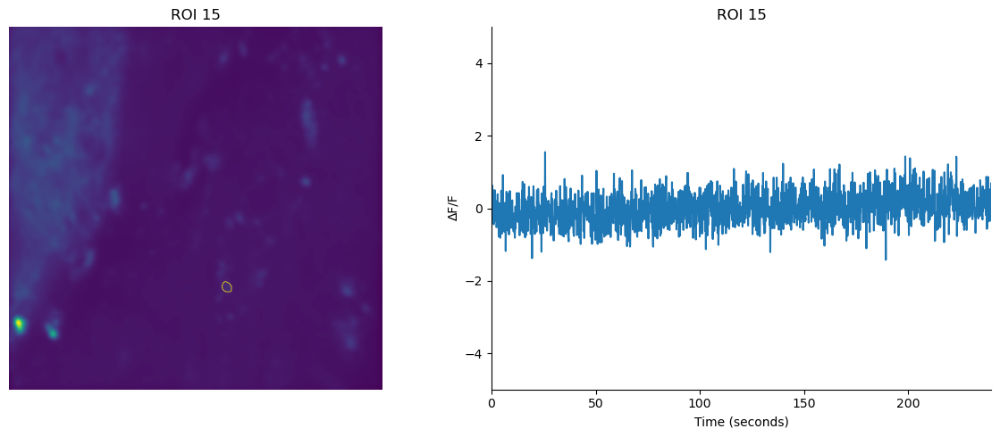

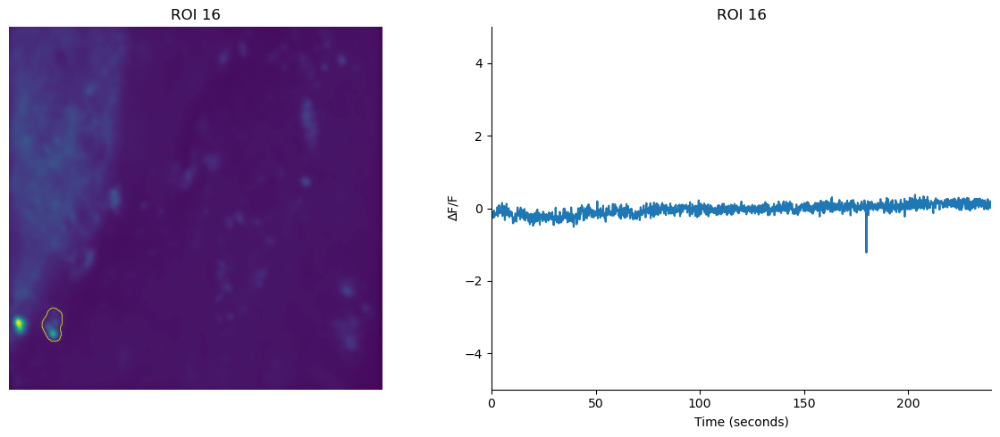

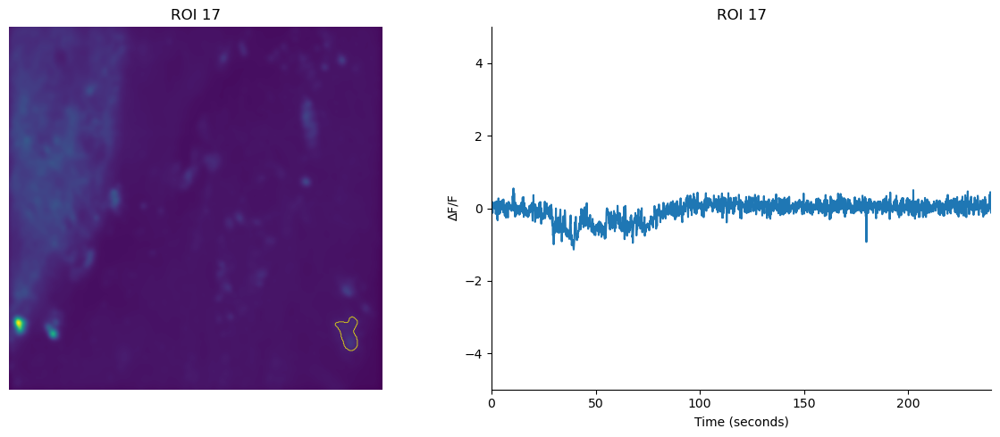

In [30]:
for roi in np.unique(rois1):
    plot_rois_deltaf(crop_aligned1, blurred_frame1, rois1, roi=roi, xlim=240)

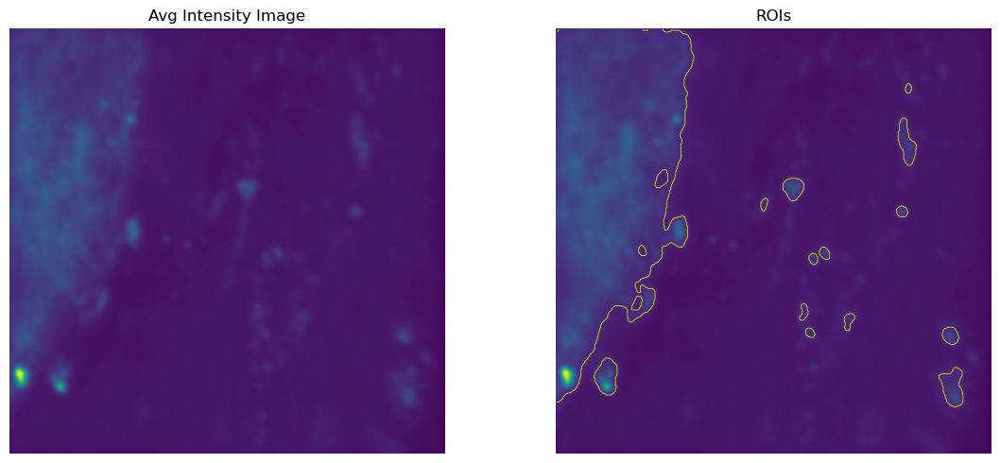

In [31]:
blurred_frame2, rois2 = make_rois(crop_aligned2, threshold_multiplier=0.95)
plot_rois(blurred_frame2, rois2)

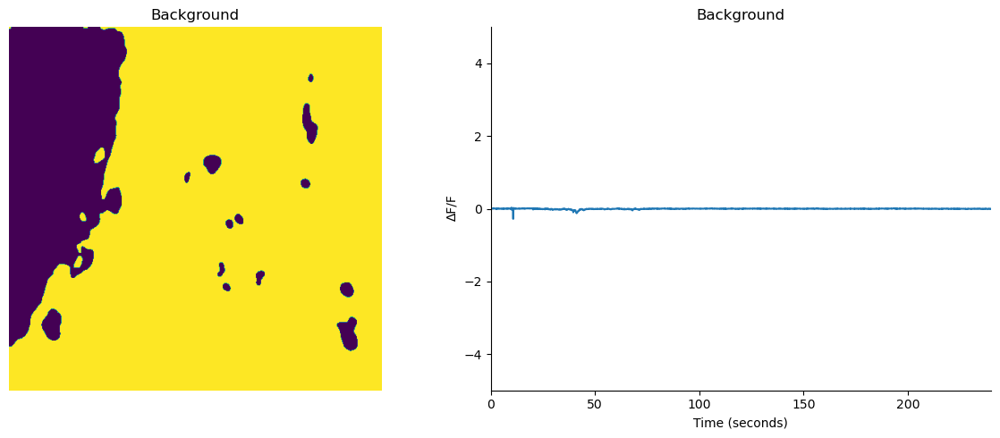

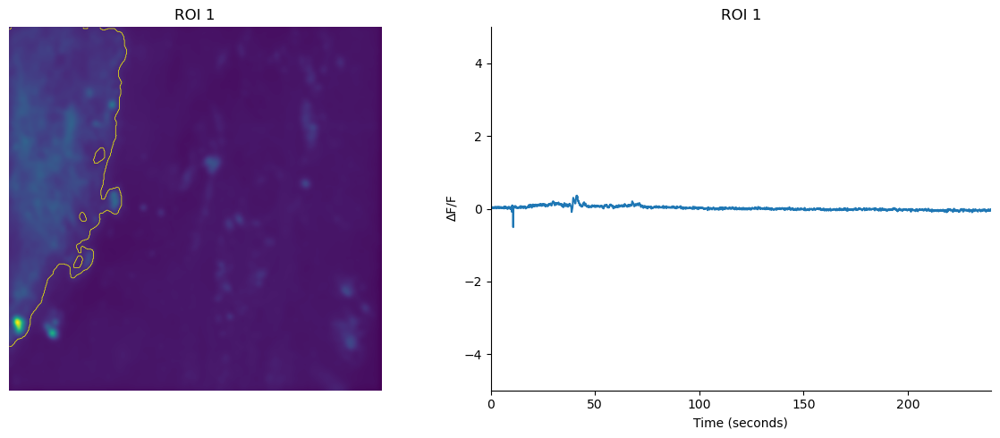

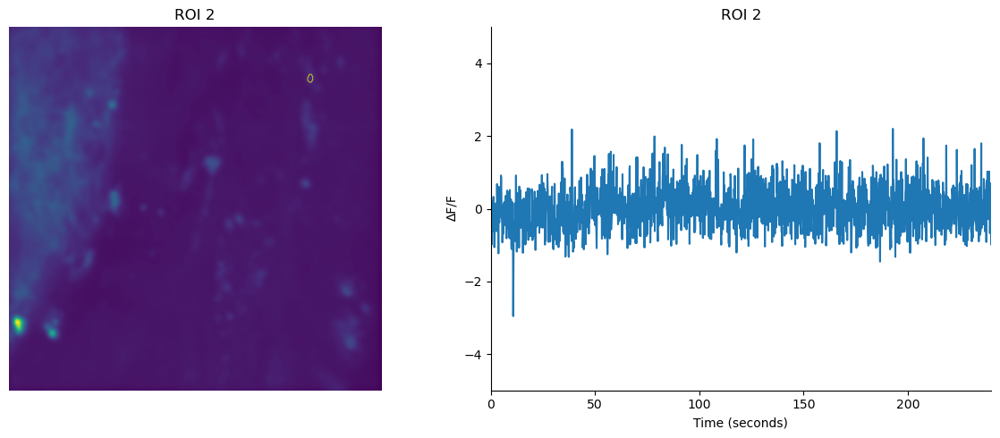

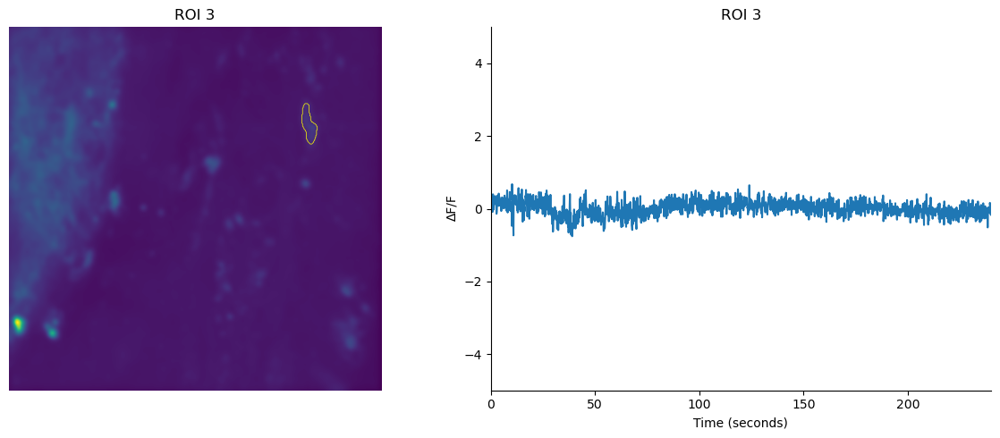

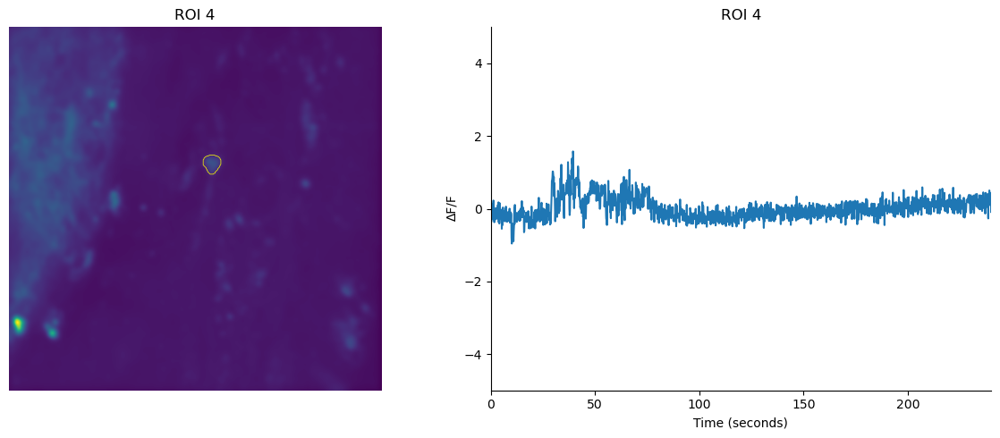

...

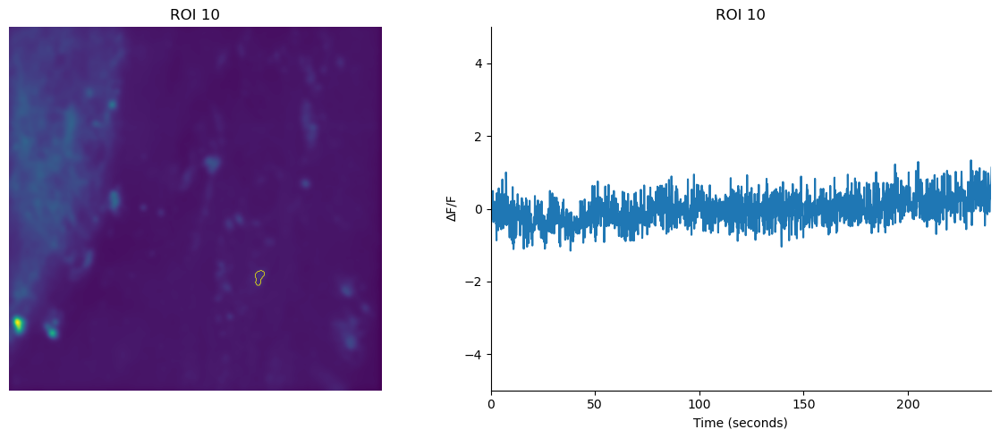

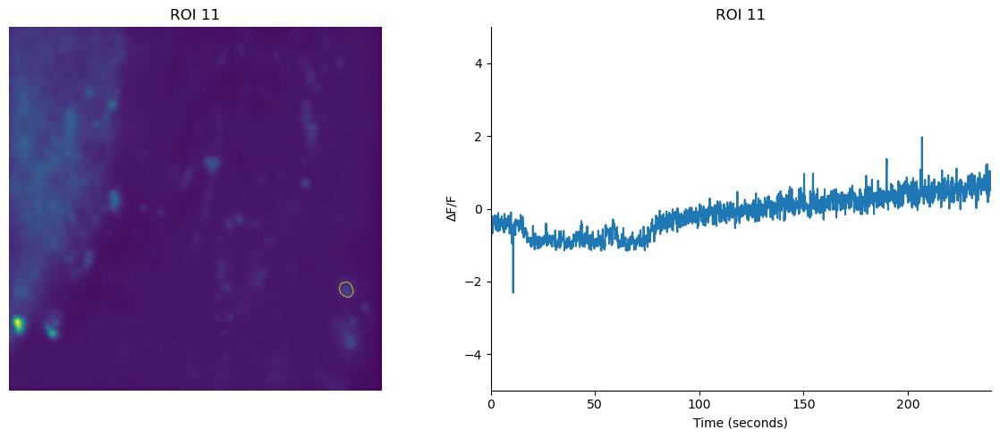

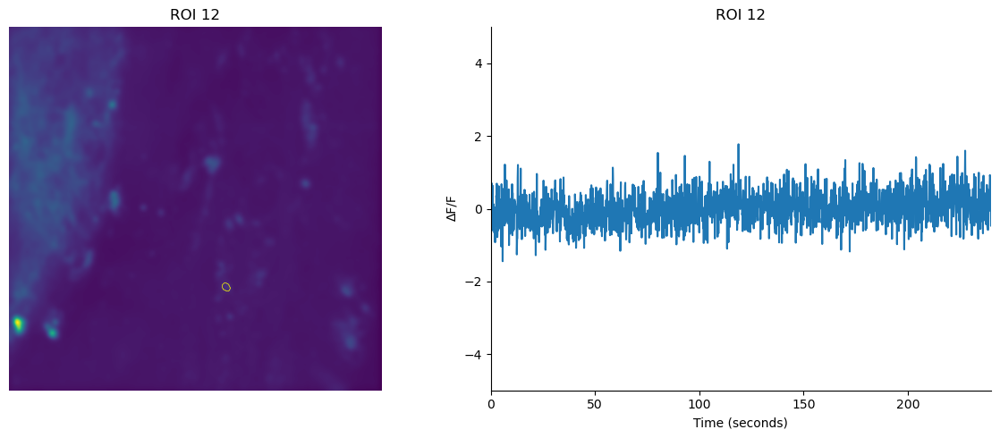

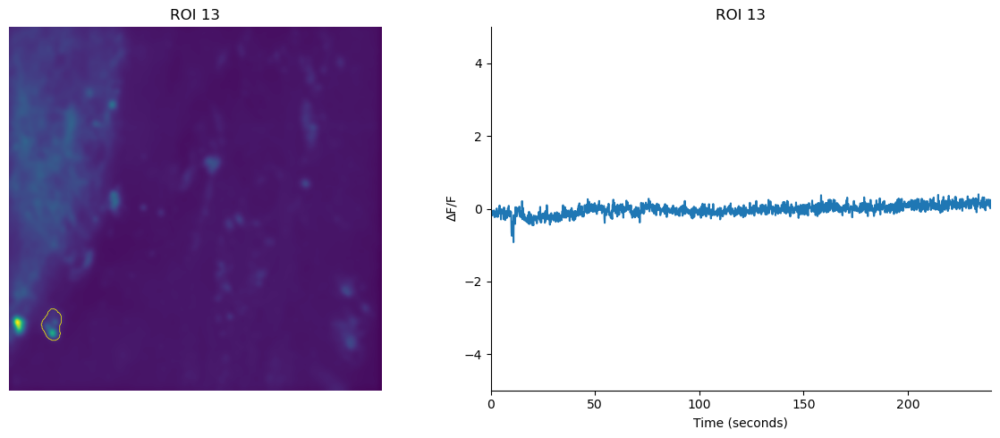

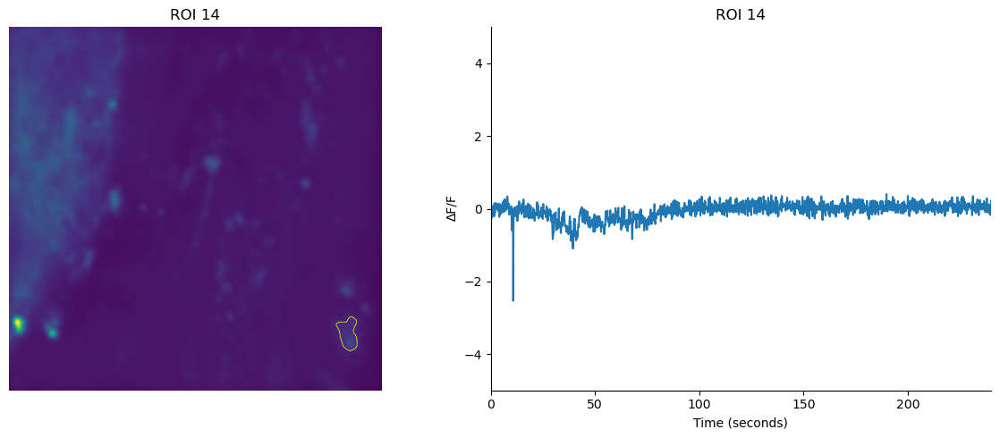

In [32]:
for roi in np.unique(rois2):
    plot_rois_deltaf(crop_aligned2, blurred_frame2, rois2, roi=roi, xlim=240)

In [33]:
# Use rolling average to smooth out some noise
avg_plane1 = roll_avg(crop_aligned1, roll_size=10)
avg_plane1.shape

(1991, 493, 507)

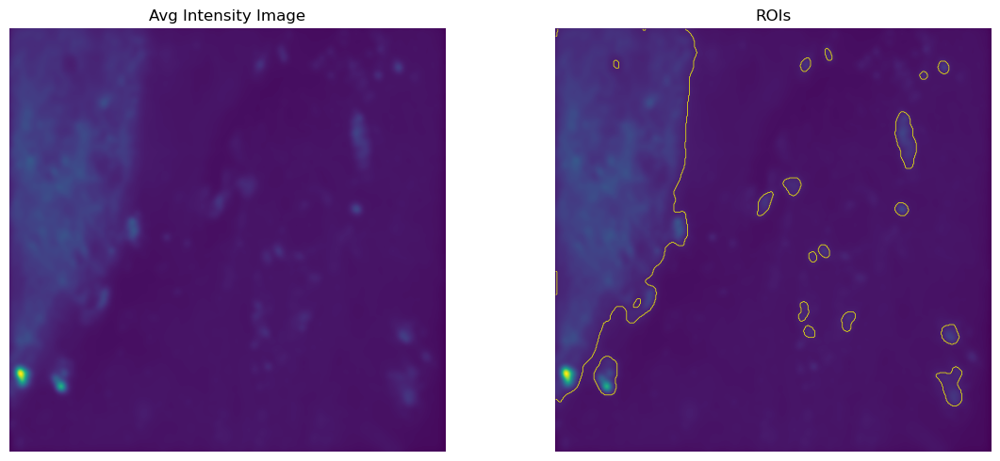

In [34]:
blurred_frame, rois = make_rois(avg_plane1, threshold_multiplier=0.91)
plot_rois(blurred_frame, rois)

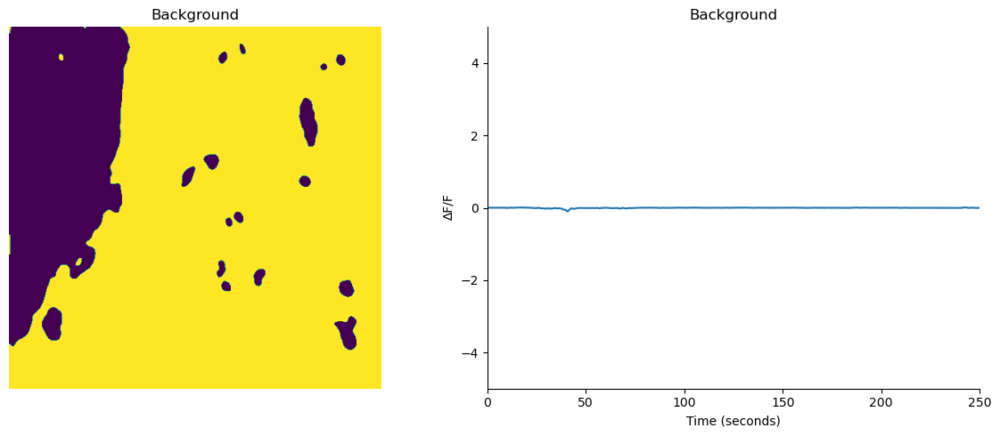

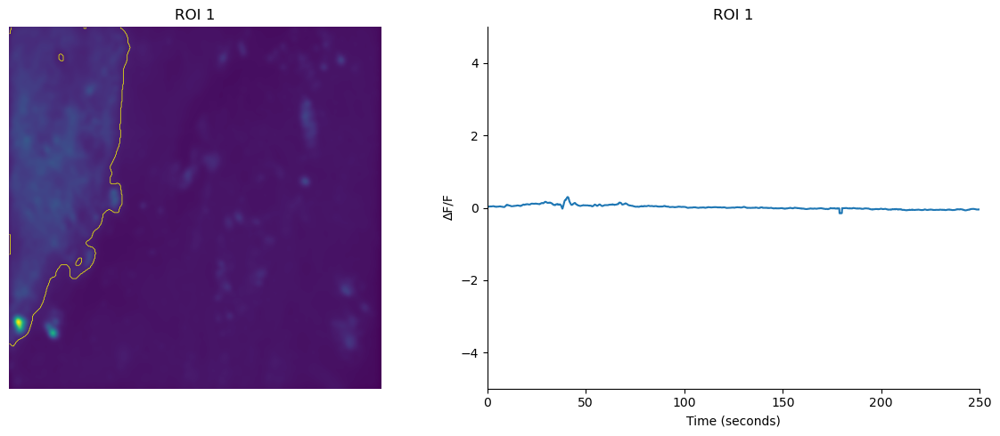

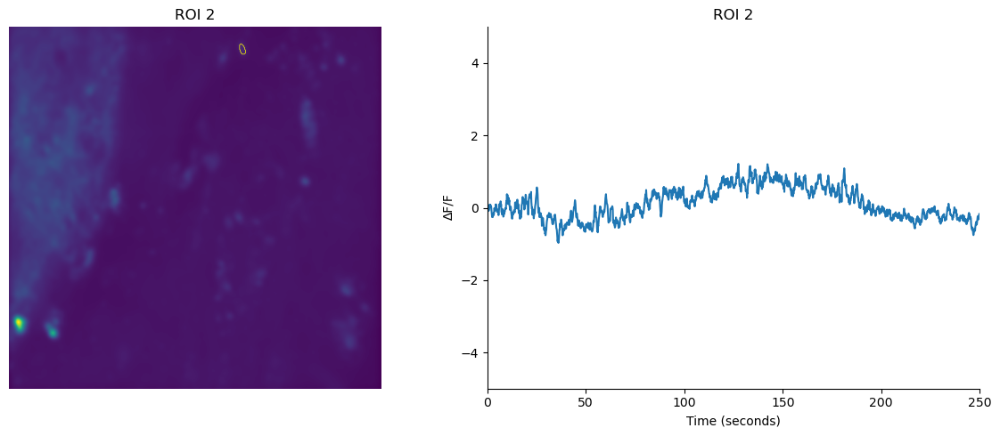

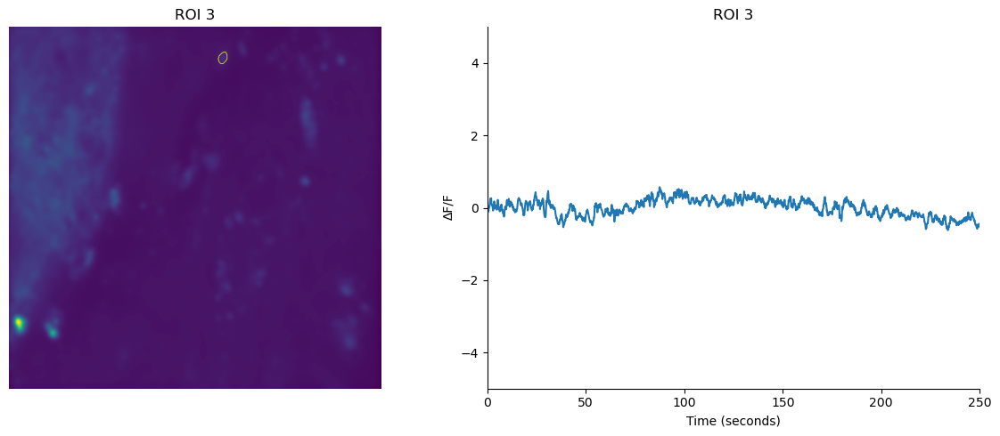

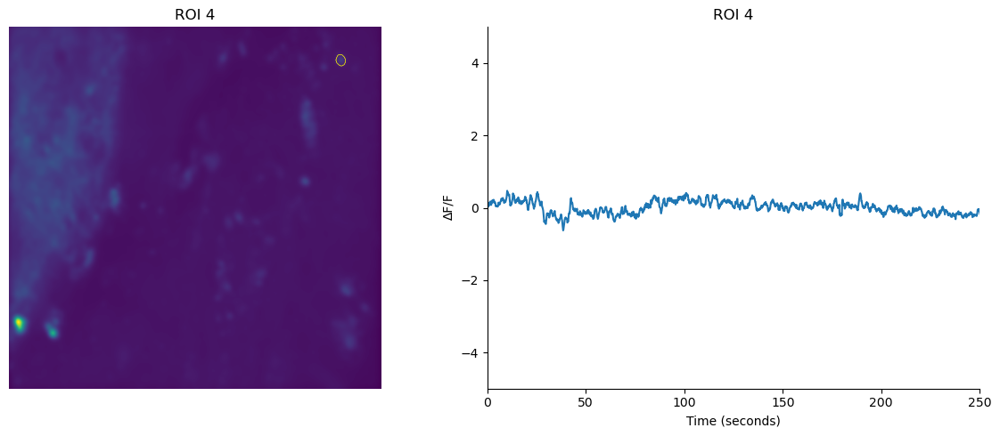

...

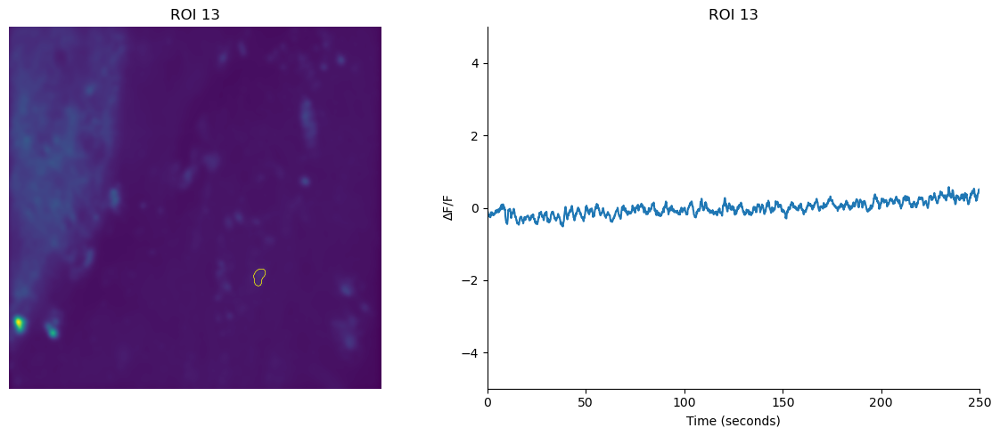

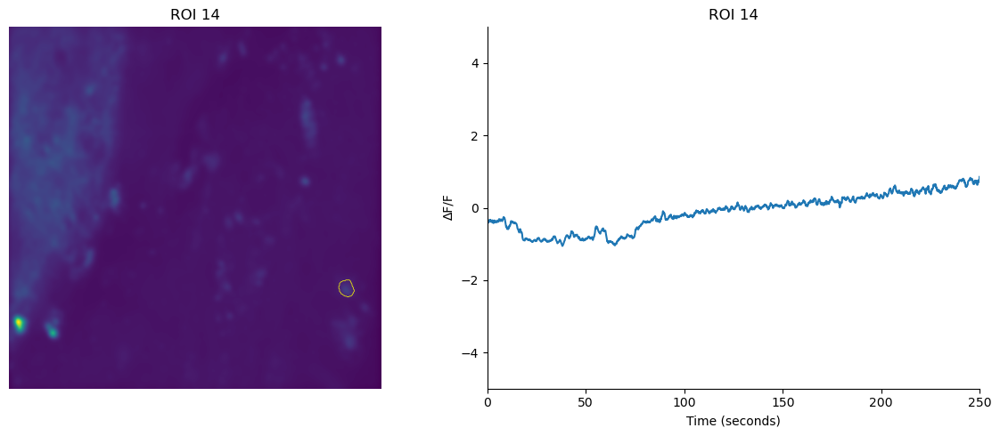

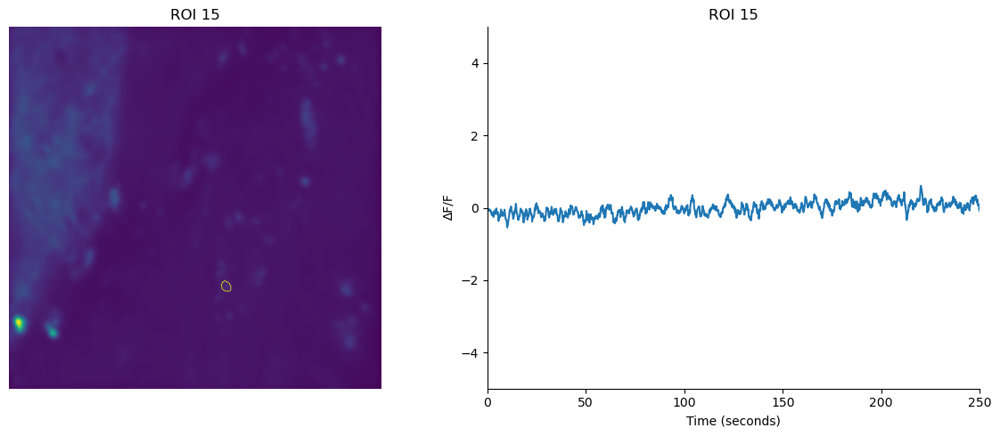

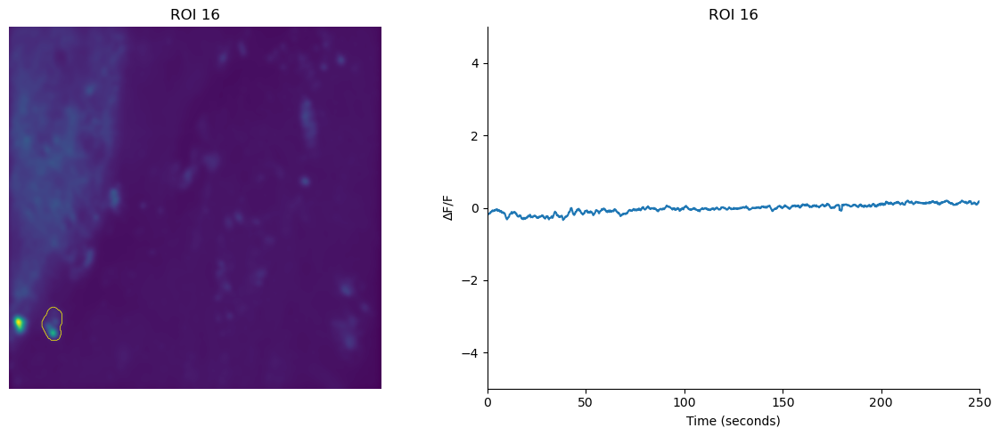

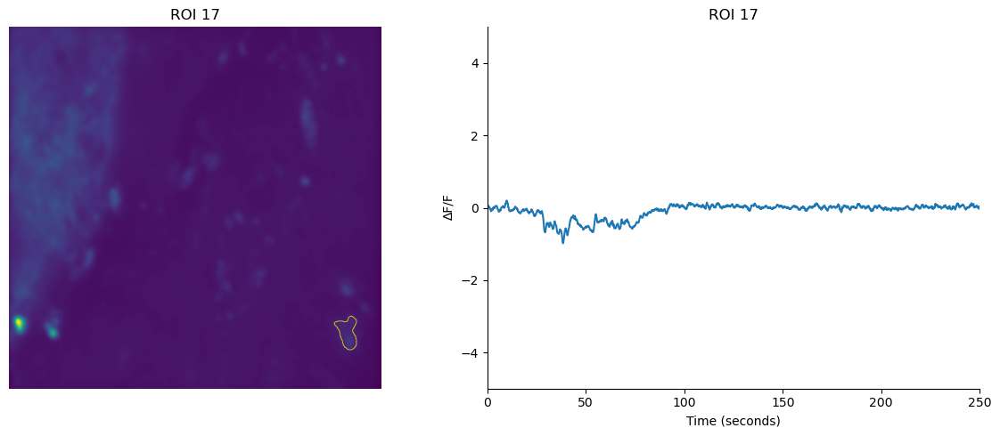

In [35]:
for roi in np.unique(rois):
    plot_rois_deltaf(avg_plane1, blurred_frame, rois, roi=roi, xlim=250)

In [36]:
avg_plane2 = roll_avg(crop_aligned2, roll_size=10)
avg_plane2.shape

(1991, 494, 506)

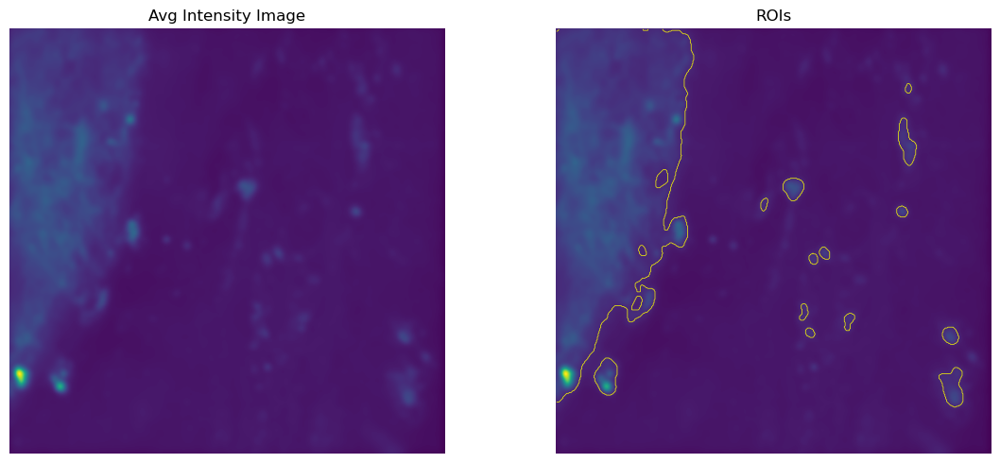

In [37]:
blurred_frame, rois = make_rois(avg_plane2, threshold_multiplier=0.95)
plot_rois(blurred_frame, rois)

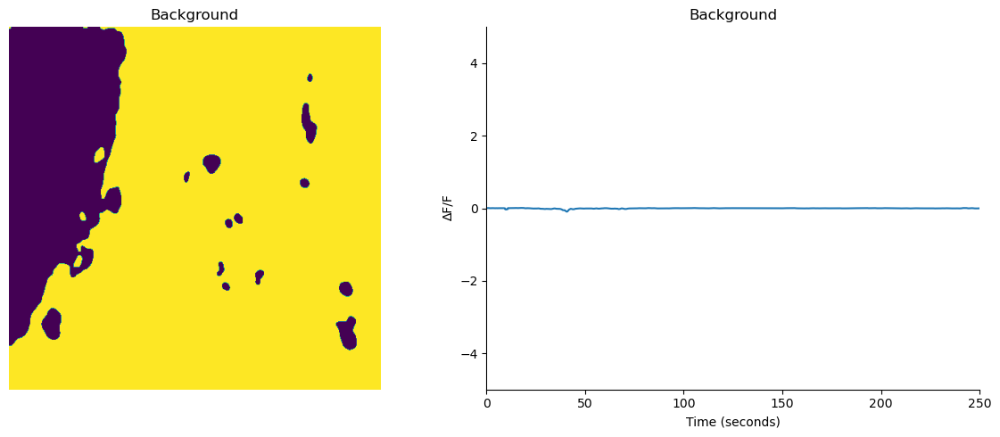

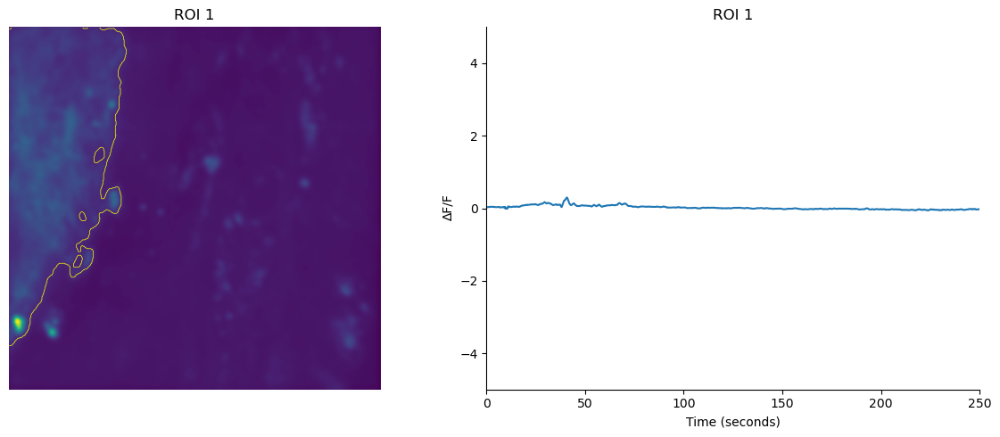

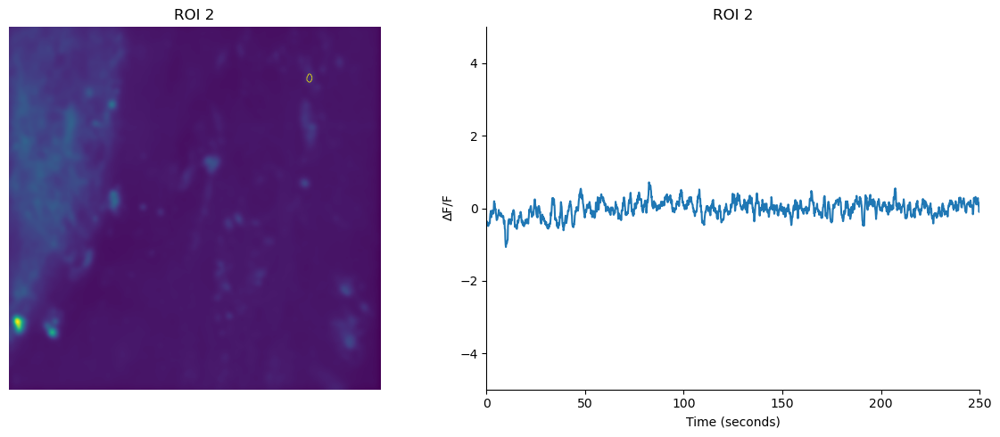

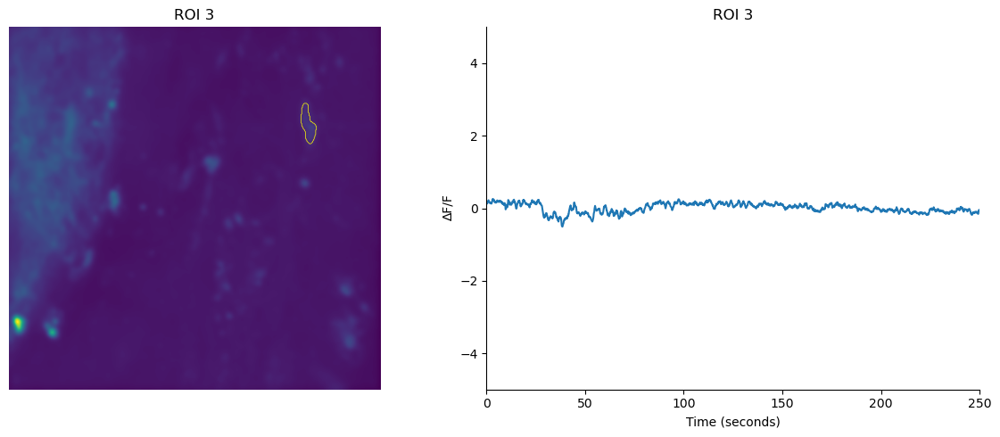

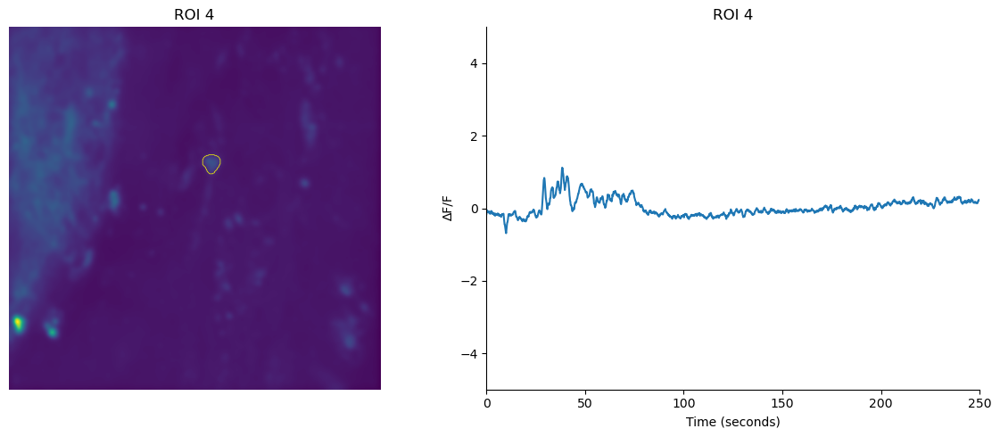

...

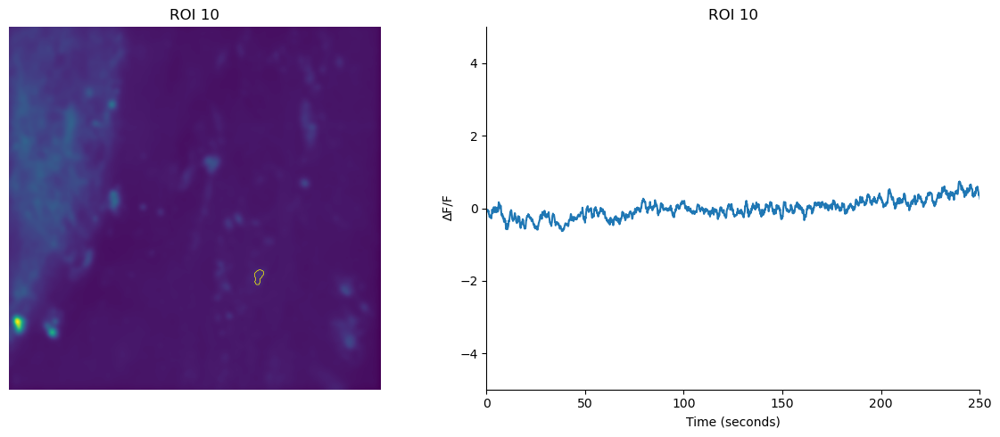

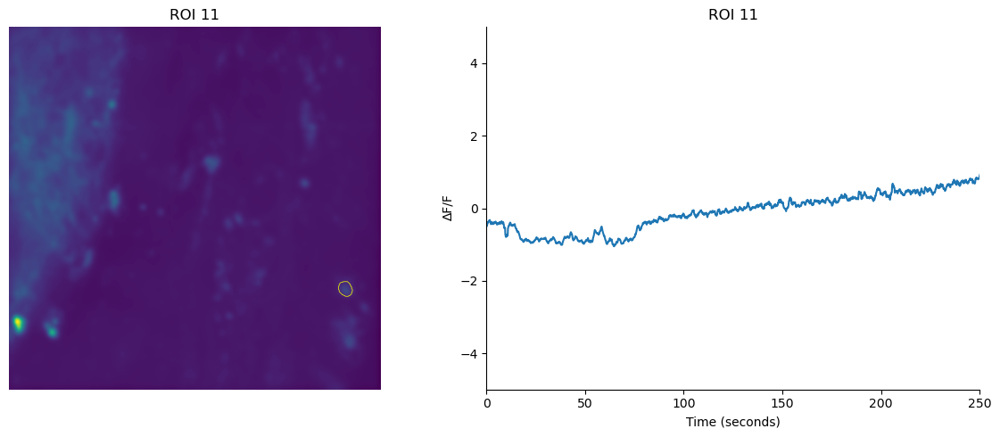

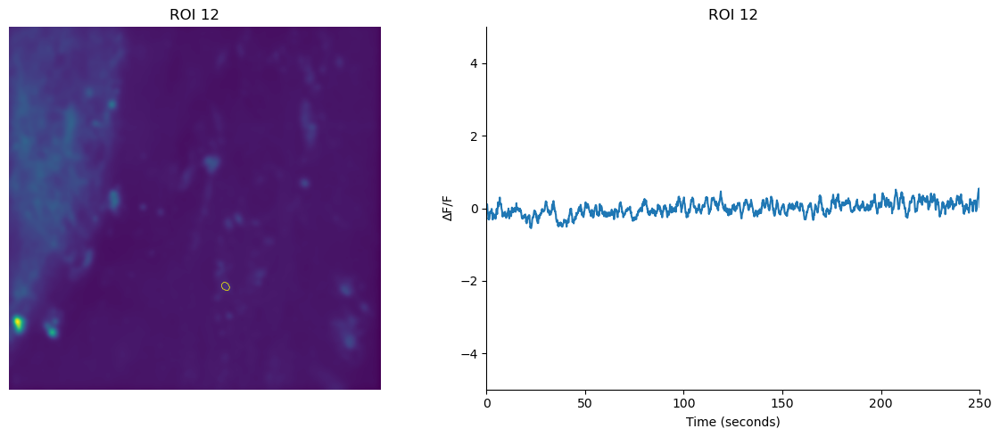

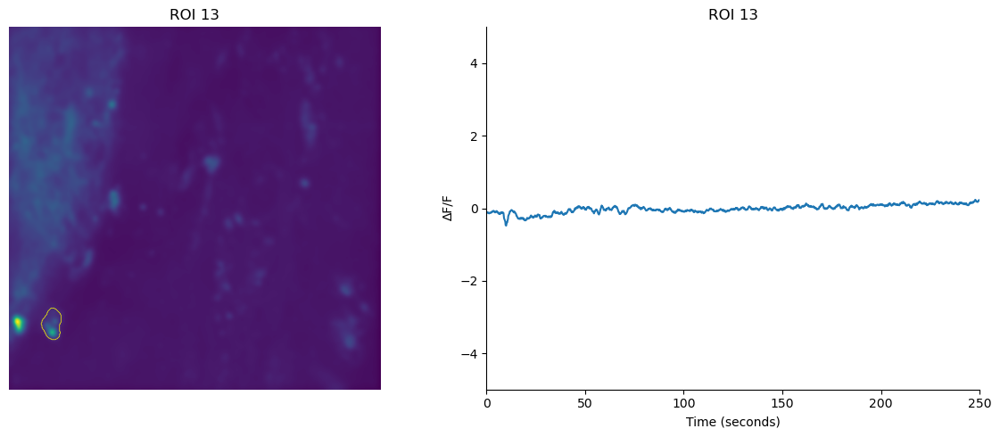

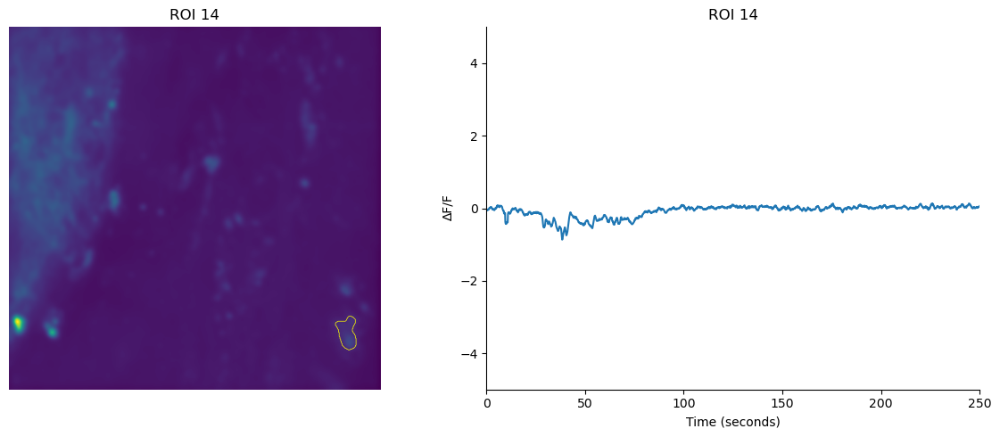

In [95]:
for roi in np.unique(rois):
    plot_rois_deltaf(avg_plane2, blurred_frame, rois, roi=roi, xlim=250)

# Automatic Iterative Alignment and Cropping

In [299]:
def iterative_align(unaligned_frames, n_iterations):
    """
    Iteratively compute reference frame, align frames to reference, crops edge artifacts, then repeats for n_iterations.
    NB: there is minimal improvement in alignment accuracy between one vs five iterations, but substantial time increase.
    
    Parameters:
        n_iterations (int): Number of iterations to run.
        unaligned_frames (np.ndarray): 3D array with shape (N, H, W).
    
    Returns:
        crop_ref (np.ndarray): A 2D array of the cropped computed reference frame.
        crop_original (np.ndarray): A crop of the original 3D array of frames.
        crop_aligned (np.ndarray): A crop of the 3D array of frames aligned to the reference frame.
    """
    
    for i in range(n_iterations):
        if i == 0:
            ref_frame, aligned_frames = align_frames(unaligned_frames)
            t, b, l, r = generate_crop_indices(aligned_frames)
            crop_ref = crop(ref_frame, t, b, l, r)
            crop_original = crop(unaligned_frames, t, b, l, r)
            crop_aligned = crop(aligned_frames, t, b, l, r)
        else:
            ref_frame, aligned_frames = align_frames(crop_aligned)
            t, b, l, r = generate_crop_indices(aligned_frames)
            crop_ref = crop(crop_ref, t, b, l, r)
            crop_original = crop(crop_original, t, b, l, r)
            crop_aligned = crop(aligned_frames, t, b, l, r)
            
    return crop_ref, crop_original, crop_aligned

In [267]:
plane1_trim = plane1[:800].copy() # Take first 800 frames of plane 1
plane1_trim.shape

(800, 512, 512)

In [270]:
ref, original, aligned = iterative_align(plane1_trim, 5)
print(compare_corr(original, aligned))

Mean Unaligned Corr: 0.068
Mean Aligned Corr:   0.082


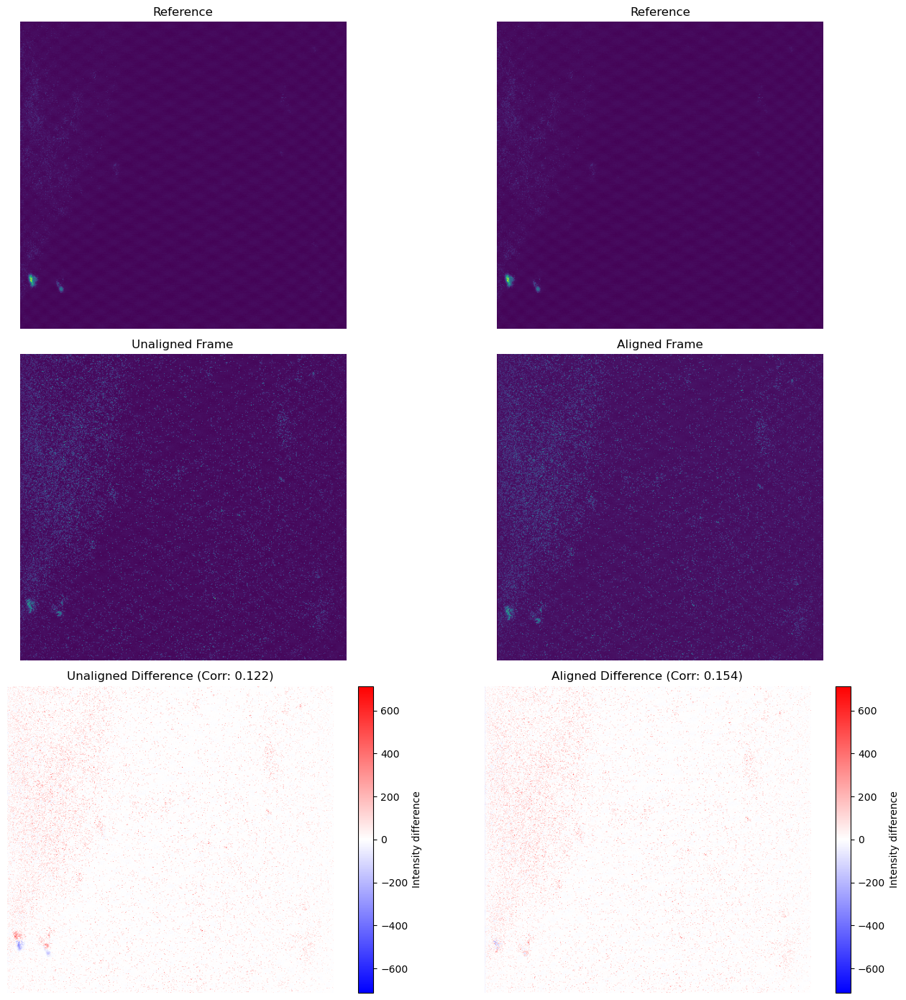

In [275]:
visualise_alignment(ref, original[-1], aligned[-1])

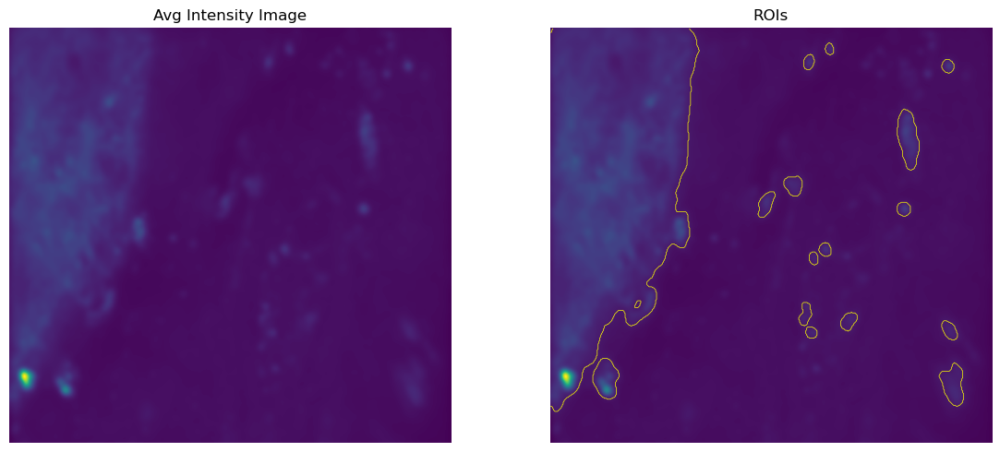

In [289]:
averaged_aligned = roll_avg(aligned, roll_size=10)
average_img, rois = make_rois(averaged_aligned, threshold_multiplier=0.88, min_area=100)
plot_rois(average_img, rois)

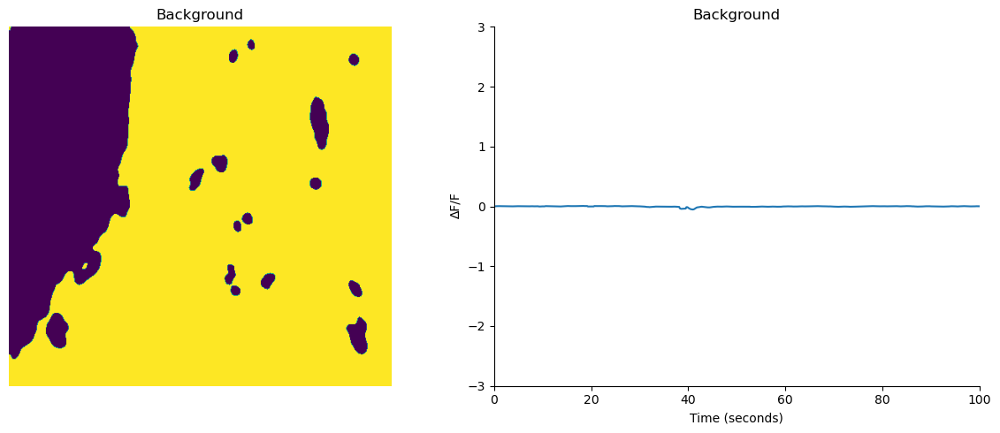

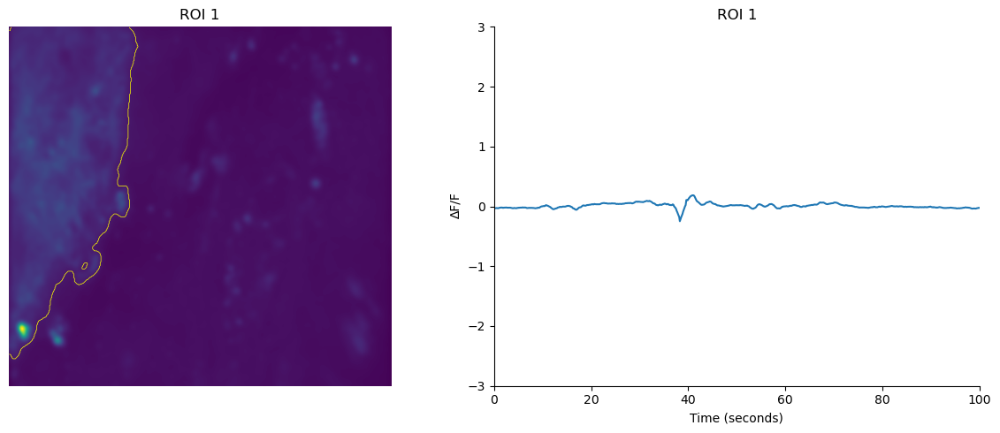

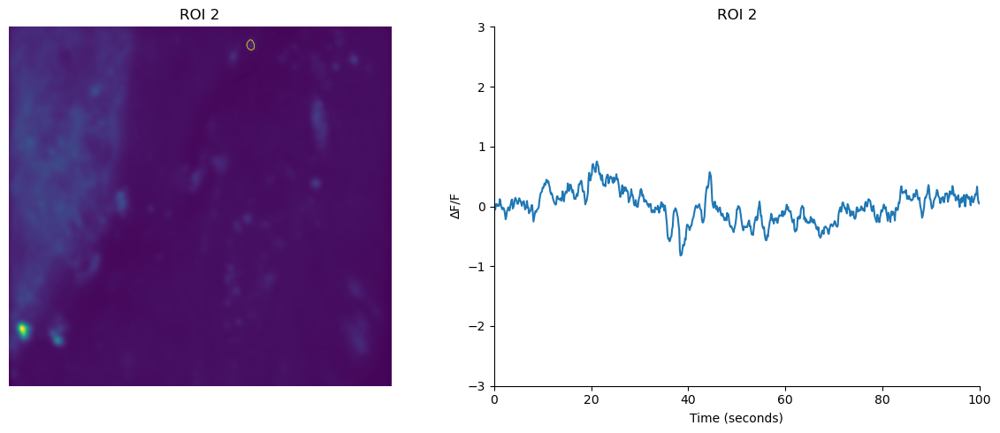

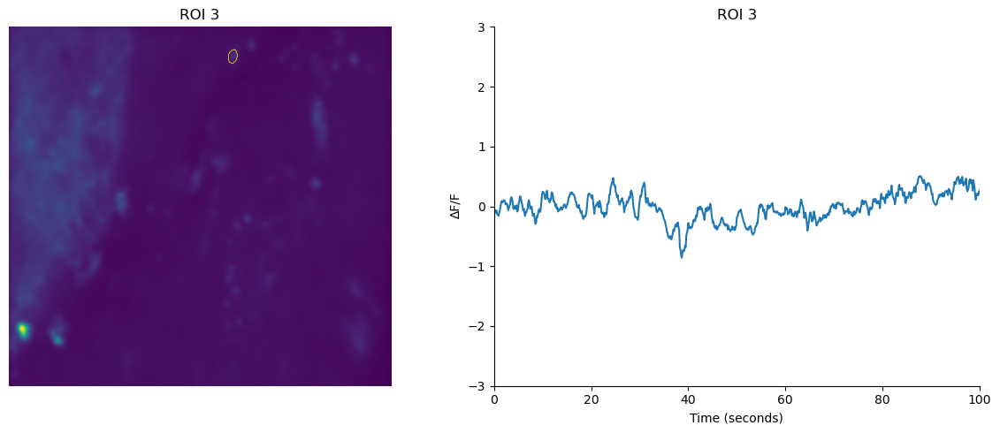

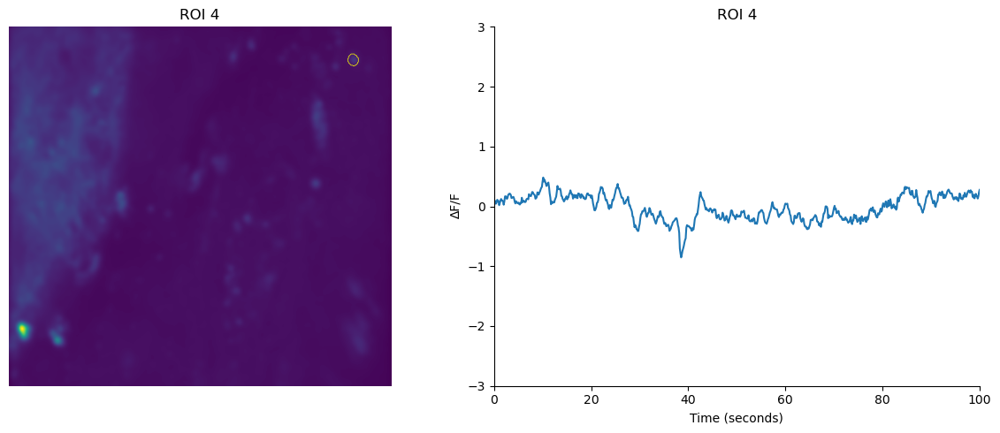

...

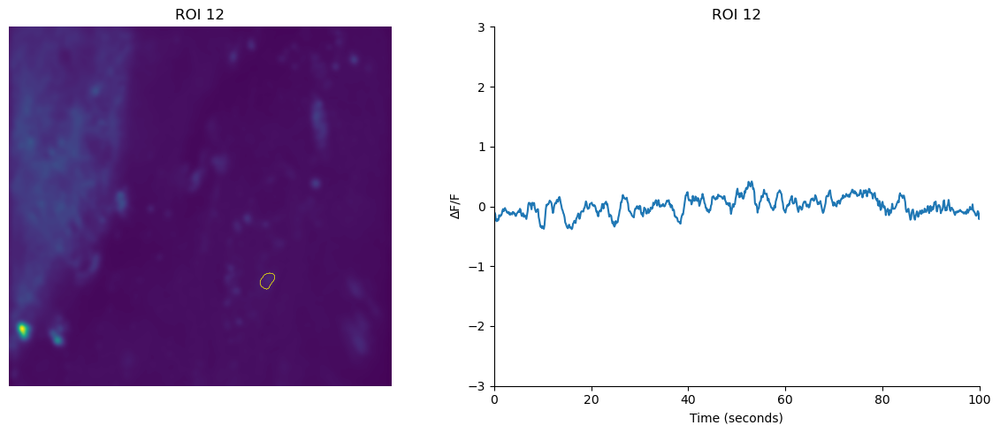

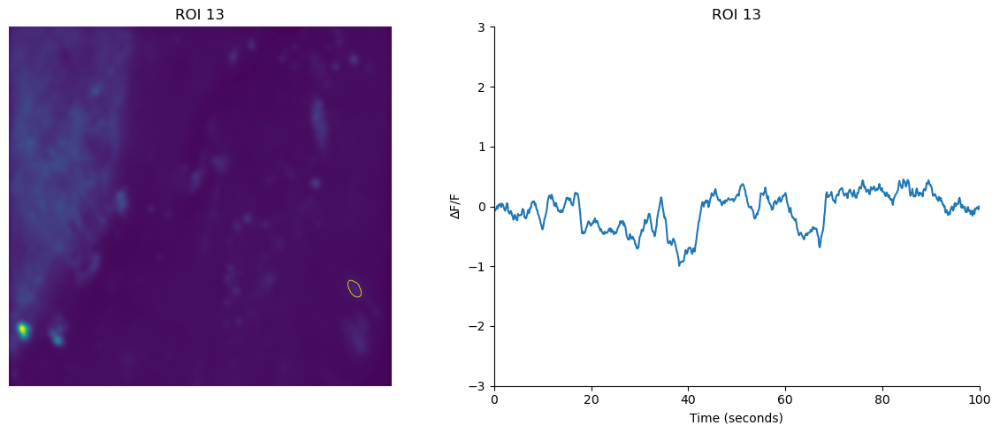

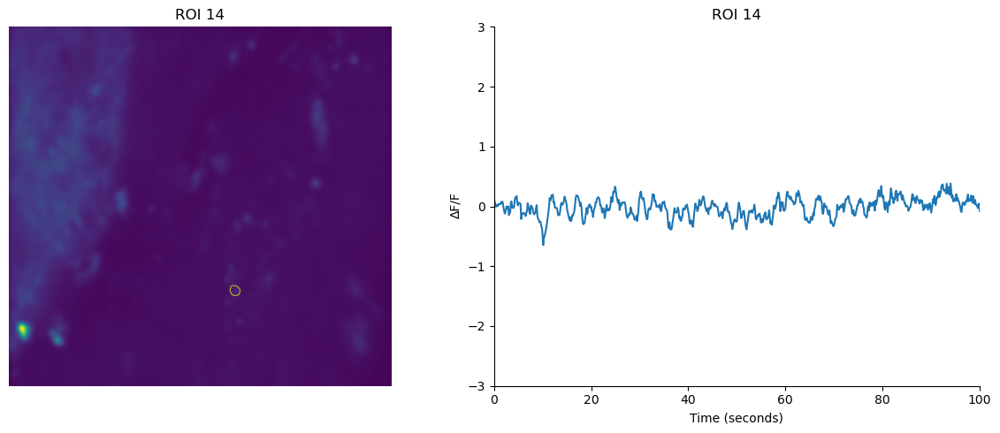

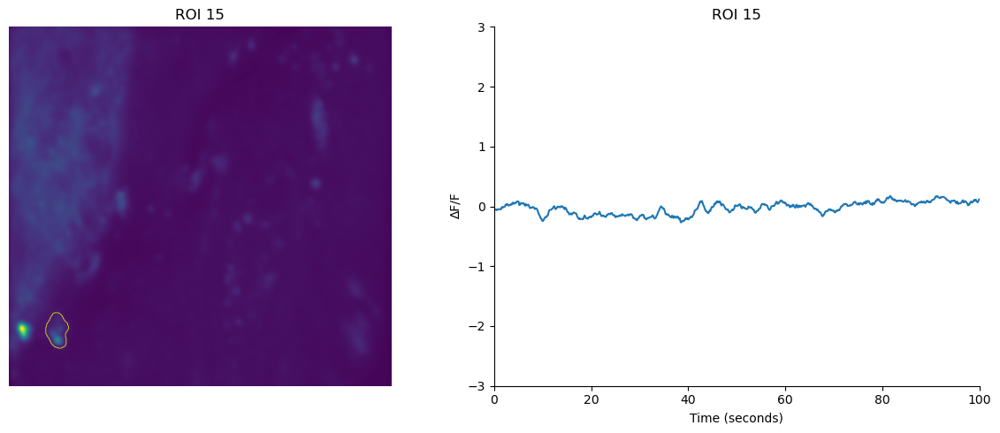

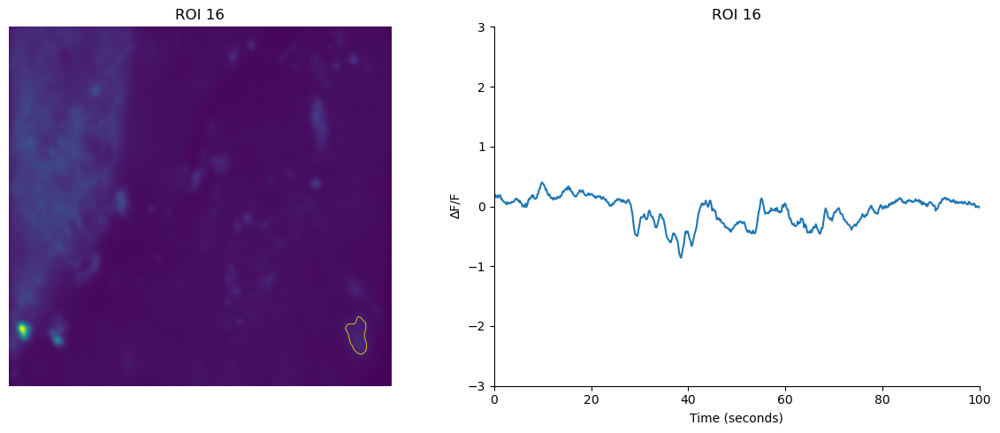

In [291]:
for roi in np.unique(rois):
    plot_rois_deltaf(averaged_aligned, average_img, rois, roi=roi, xlim=100, ylim=3)